# 1)    Introduction


## 1.1) Motivation
One of the biggest and most complicated marketplaces in the world is real estate, which is affected by a variety of external variables, fluctuating prices, supply and demand dynamics, and other factors. Homeowners, prospective buyers, sellers, and investors may find accurate real estate price forecasting to be an extremely useful instrument. Real estate price forecasting can help with risk management strategies, investment choices, and useful market insights.

To help with investment decisions, real estate price forecasting is one of the primary goals. Price prediction models can help investors and financial institutions assess the potential returns of real estate investments, assess the risk involved with investments, and make well-informed choices. Real estate price forecasting can be used to find profitable investment possibilities, boost returns, and reduce risks.

To ease economic analysis, real estate price forecasting is also important. Real estate is a crucial aspect of the economy, and changes in the real estate market can reveal how well-off a nation or region's economy is overall. Policymakers can spot trends, decide on interest rates intelligently, and control economic development by looking at real estate prices. Accurate real estate price forecasts can also help banks and other financial organizations assess the strength of their loan portfolios and modify their lending policies as necessary.

The control of risks can also benefit from real estate price forecasting. Real estate price prediction models are used by banks and other financial organizations to evaluate the risk of mortgage loans. Lenders can determine the probability of default, modify their lending practices appropriately, and make wise choices regarding risk management by analyzing historical data.

The ability to forecast real estate values can also be useful for marketing initiatives. Price prediction models can be used by real estate brokers to find prospective buyers and sellers as well as to decide on the best pricing strategy for a given property. Agents can improve their recommendations to clients and improve their odds of closing deals by having a better understanding of the variables that influence real estate prices.

In conclusion, predicting real estate prices can be a powerful tool for homeowners, buyers, sellers, investors, policymakers, and real estate agents. By providing valuable insights into market trends, informing investment decisions, and facilitating risk management strategies, accurate price predictions can help maximize returns, minimize risks, and foster economic growth.

## 1.2) Problem Definition
House price fluctuations can have significant impacts on the economy and society. Over the past few decades, there have been major fluctuations in housing prices in the US. A housing bubble developed in the middle of the 2000s, fueled by speculative activity, loose lending standards, and cheap interest rates. The housing market crashed after the bubble burst, which added to the 2008 financial crisis. Since then, home prices have increased, but they are still prone to changes due to local economic circumstances and supply and demand dynamics. House prices have steadily increased in the UK for decadeds, propelled by factors like population development, low interest rates, and government initiatives that encourage home ownership. The COVID-19 pandemic and the uncertainty surrounding Brexit, however, have raised market volatility recently, causing some areas to see price drops and others to see substantial price increases. In Vietnam real estate bubble from 2007 to 2009 resulted in macroeconomic instability like high inflation, trade deficiency, and slowed economic development.

Given that investing in the real estate sector is a long-term type of investment, the price of real estate becomes an essential asset in the measurement of inflation. Statistics on real estate may offer an early indicator of changes in the economic cycle. Rising of property prices 
often leads to an expansionary phase period (boom) whereas falling of property 
prices indicate a contractionary phase (bust) (Eurostat, 2013).

In such favorable circumstances, the need for appropriate indexes that allow for precise recording of changes in real estate prices was critical. This not only helps policymakers but also market participants looking for the bottom or peak of housing prices. As a result, housing price indexes that properly capture housing market trends are required.

The establishment of such indexes, however, is a challenging task due to the heterogeneity of residential properties in terms of structural characteristics such as location, size, and amenities. Each house, including the location, upkeep, and appliances, has unique and distinguishing characteristics to varying degrees, so no two houses are similar in terms of quality. Even if the location and fundamental structure remain the same over time, the ages and quality of the structures and houses do not remain constant due to renovations and structural depreciation. Furthermore, considering houses are sold infrequently, the limited frequency of transaction data accessible makes it difficult to apply the "like with like" method to house pricing as the method of other price indexes such as the consumer price index or the producer price index.

As a consequence, developing housing price indexes was one of the most challenging jobs for national statistical agencies in terms of methodology.

## 1.3) Main contributions

Australia has the world's sixth-largest land area, with a varied variety of landscapes and scenery ranging from tropical rainforests to vast deserts. Australia's distinct geography and natural beauty have a significant impact on its real estate market, with properties providing a diverse range of lifestyle and investment options. Due to the stunning views and proximity to outdoor activities such as hiking, fishing, and surfing, properties near the shore or in the countryside are in high demand. The growing population and urbanization trends in Australia also have an impact on the real estate market, with more people moving to big cities for work and lifestyle possibilities.

The real estate market in Australia has seen fluctuations in recent years, with rising property prices and concerns over housing affordability. However, despite these issues, the market remains robust with a growing population and stable economy driving demand for properties. Due to the COVID-19 pandemic, there was a slight downturn in the market, but it has since rebounded.

Perth, the capital city of Western Australia, has had its own ups and downs in the real estate market, but it is now showing signs of recovery. Low-interest rates, government incentives, and population growth have led to an increase in demand for properties. Perth's stable economy, with a focus on mining, agriculture, and tourism, and its location make it an attractive destination for international investors. With its abundantly records of estate sold including dependable and comprehensive data, such as pertinent information like property prices, types, and location, we have decided to use Perth's estate sale data to construct predictive models that correctly forecast future property prices.  

The dataset is retrieved from a project in Kaggle. This data was scraped from http://house.speakingsame.com/ and includes data from 322 Perth suburbs, resulting in an average of about 100 rows per suburb. Other than scrapping from this source, longitude and latitude data was obtained from data.gov.au. School ranking data was obtained from bettereducation. The closest schools to each address in this dataset are those that are designated as 'ATAR-applicable'. ATAR is a scoring system used in the Australian secondary school education system to evaluate a student's culminative academic results and is used for entry into Australian universities. As a result, schools that do not have an ATAR program, such as primary schools, vocational schools, special needs schools, and so on, are not taken into account when determining the closest school. Please keep in mind that there are some missing rows in the "NEAREST_SCH_RANK" column because some institutions are not ranked according to this criteria by bettereducation.


# 2.) Data preprocessing

Import all libraries

In [154]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from scipy import stats
import tensorflow as tf
import folium
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error,mean_absolute_error,explained_variance_score, r2_score

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, LeakyReLU
from tensorflow.keras.activations import linear, relu, sigmoid

## 2.1) Perth house pricing dataframe

Import dataset

In [155]:
df = pd.read_csv("https://raw.githubusercontent.com/siunhanvjp/Perth-House-Price-Prediction/main/all_perth_310121.csv")
df

,ADDRESS,SUBURB,PRICE,BEDROOMS,BATHROOMS,GARAGE,LAND_AREA,FLOOR_AREA,BUILD_YEAR,CBD_DIST,NEAREST_STN,NEAREST_STN_DIST,DATE_SOLD,POSTCODE,LATITUDE,LONGITUDE,NEAREST_SCH,NEAREST_SCH_DIST,NEAREST_SCH_RANK
0,1 Acorn Place,South Lake,565000,4,2,2.0,600,160,2003.0,18300,Cockburn Central Station,1800,09-2018\r,6164,-32.115900,115.842450,LAKELAND SENIOR HIGH SCHOOL,0.828339,NaN
1,1 Addis Way,Wandi,365000,3,2,2.0,351,139,2013.0,26900,Kwinana Station,4900,02-2019\r,6167,-32.193470,115.859554,ATWELL COLLEGE,5.524324,129.0
2,1 Ainsley Court,Camillo,287000,3,1,1.0,719,86,1979.0,22600,Challis Station,1900,06-2015\r,6111,-32.120578,115.993579,KELMSCOTT SENIOR HIGH SCHOOL,1.649178,113.0
3,1 Albert Street,Bellevue,255000,2,1,2.0,651,59,1953.0,17900,Midland Station,3600,07-2018\r,6056,-31.900547,116.038009,SWAN VIEW SENIOR HIGH SCHOOL,1.571401,NaN
4,1 Aman Place,Lockridge,325000,4,1,2.0,466,131,1998.0,11200,Bassendean Station,2000,11-2016\r,6054,-31.885790,115.947780,KIARA COLLEGE,1.514922,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
33651,9C Gold Street,South Fremantle,1040000,4,3,2.0,292,245,2013.0,16100,Fremantle Station,1500,03-2016\r,6162,-32.064580,115.751820,CHRISTIAN BROTHERS' COLLEGE,1.430350,49.0
33652,9C Pycombe Way,Westminster,410000,3,2,2.0,228,114,NaN,9600,Stirling Station,4600,02-2017\r,6061,-31.867055,115.841403,JOHN SEPTIMUS ROE ANGLICAN COMMUNITY SCHOOL,1.679644,35.0
33653,9D Pycombe Way,Westminster,427000,3,2,2.0,261,112,NaN,9600,Stirling Station,4600,02-2017\r,6061,-31.866890,115.841418,JOHN SEPTIMUS ROE ANGLICAN COMMUNITY SCHOOL,1.669159,35.0
33654,9D Shalford Way,Girrawheen,295000,3,1,2.0,457,85,1974.0,12600,Warwick Station,4400,10-2016\r,6064,-31.839680,115.842410,GIRRAWHEEN SENIOR HIGH SCHOOL,0.358494,NaN


### 2.1.1) Keep neccessary attributes

### 2.1.2) Deal with missing data

Count *missing value* in ```df```

In [156]:
df.isna().sum()

ADDRESS                 0
SUBURB                  0
PRICE                   0
BEDROOMS                0
BATHROOMS               0
GARAGE               2478
LAND_AREA               0
FLOOR_AREA              0
BUILD_YEAR           3155
CBD_DIST                0
NEAREST_STN             0
NEAREST_STN_DIST        0
DATE_SOLD               0
POSTCODE                0
LATITUDE                0
LONGITUDE               0
NEAREST_SCH             0
NEAREST_SCH_DIST        0
NEAREST_SCH_RANK    10952
dtype: int64

There are three columns that have *missing values*, which are ```GARAGE```, ```BUILD_YEAR```, ```NEAREST_SCH_RANK```

For ```BUILD_YEAR``` column, we will remove rows that have *missing values* on this attribute

In [157]:
df.dropna(subset=["BUILD_YEAR"], axis=0, inplace=True)

In [158]:
df['GARAGE'].value_counts()

2.0     18747
1.0      4834
3.0      1858
4.0      1767
6.0       418
5.0       327
8.0       115
7.0        86
10.0       24
12.0       24
9.0        16
14.0       11
13.0        7
11.0        5
16.0        4
18.0        3
20.0        2
32.0        1
17.0        1
21.0        1
99.0        1
26.0        1
22.0        1
50.0        1
31.0        1
Name: GARAGE, dtype: int64

As my suspected, there is no value **0** which means the NaN value is for 0 garage

For ```GARAGE``` column, we will replace *missing values* with ```0```

Moreover, which kind of house would has 99 garages or 50 garages ?? This must be some kind of mistakes or misunderstanding concept of the seller, and because the number of abnormal garage is kinda small so I also decide to drop it, we will take the house with maximum 10 garages.

In [159]:
df['GARAGE'].replace(np.nan, 0, inplace=True)
df['GARAGE'] = df['GARAGE'].astype('int')
df = df[df['GARAGE'] <= 10]

Recheck the number of ```NA``` in the dataset

In [160]:
df.isna().sum()

ADDRESS                0
SUBURB                 0
PRICE                  0
BEDROOMS               0
BATHROOMS              0
GARAGE                 0
LAND_AREA              0
FLOOR_AREA             0
BUILD_YEAR             0
CBD_DIST               0
NEAREST_STN            0
NEAREST_STN_DIST       0
DATE_SOLD              0
POSTCODE               0
LATITUDE               0
LONGITUDE              0
NEAREST_SCH            0
NEAREST_SCH_DIST       0
NEAREST_SCH_RANK    9779
dtype: int64

There is still ```NEAREST_SCH_RANK``` to be dealt with, according to the author of this data: *each school is ranked based on the ATAR system, schools which do not have an ATAR program such as primary schools, vocational schools, special needs schools etc. are not considered* and we can see there is about 30% of the data missing this values, I consider we should drop this columns because it wont affected the house price this much. However, we should make another prediction for those who has this ranking to see the difference, but now just drop it

In [161]:
df = df.drop(columns=['NEAREST_SCH_RANK'])

### 2.1.3) Calculate house age

First we add a column called ```SOLD_YEAR```, which is the **year of purchased** from column ```DATE_SOLD```

In [162]:
#create SOLD_YEAR FROM DATE_SOLD
df['SOLD_YEAR'] = df['DATE_SOLD'].str.extract('(\d{4})')
df['SOLD_YEAR'] = df['SOLD_YEAR'].astype('int64')
#drop DATE_SOLD
df = df.drop('DATE_SOLD', axis=1)
df

,ADDRESS,SUBURB,PRICE,BEDROOMS,BATHROOMS,GARAGE,LAND_AREA,FLOOR_AREA,BUILD_YEAR,CBD_DIST,NEAREST_STN,NEAREST_STN_DIST,POSTCODE,LATITUDE,LONGITUDE,NEAREST_SCH,NEAREST_SCH_DIST,SOLD_YEAR
0,1 Acorn Place,South Lake,565000,4,2,2,600,160,2003.0,18300,Cockburn Central Station,1800,6164,-32.115900,115.842450,LAKELAND SENIOR HIGH SCHOOL,0.828339,2018
1,1 Addis Way,Wandi,365000,3,2,2,351,139,2013.0,26900,Kwinana Station,4900,6167,-32.193470,115.859554,ATWELL COLLEGE,5.524324,2019
2,1 Ainsley Court,Camillo,287000,3,1,1,719,86,1979.0,22600,Challis Station,1900,6111,-32.120578,115.993579,KELMSCOTT SENIOR HIGH SCHOOL,1.649178,2015
3,1 Albert Street,Bellevue,255000,2,1,2,651,59,1953.0,17900,Midland Station,3600,6056,-31.900547,116.038009,SWAN VIEW SENIOR HIGH SCHOOL,1.571401,2018
4,1 Aman Place,Lockridge,325000,4,1,2,466,131,1998.0,11200,Bassendean Station,2000,6054,-31.885790,115.947780,KIARA COLLEGE,1.514922,2016
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
33648,9B Teocote Crescent,Aubin Grove,423000,3,2,2,248,108,2011.0,24900,Cockburn Central Station,5700,6164,-32.176013,115.858357,ATWELL COLLEGE,3.607062,2016
33649,9B Viveash Road,Middle Swan,467000,4,2,2,400,132,2014.0,17100,Midland Station,2500,6056,-31.872192,116.013543,LA SALLE COLLEGE,1.116806,2015
33650,9b Wesley Street,South Fremantle,955000,3,2,1,200,127,1997.0,16000,Fremantle Station,1900,6162,-32.066410,115.756070,FREMANTLE COLLEGE,1.134956,2019
33651,9C Gold Street,South Fremantle,1040000,4,3,2,292,245,2013.0,16100,Fremantle Station,1500,6162,-32.064580,115.751820,CHRISTIAN BROTHERS' COLLEGE,1.430350,2016


Calculate ```AGE``` of the house at the time of purchased by subtracting the ```BUILD_YEAR``` from the ```SOLD_YEAR```

In [163]:
df_age = df['SOLD_YEAR'].astype('int') - df['BUILD_YEAR'].astype('int')
df_age =df_age.to_frame()
df_age.columns = ["AGE"]
df = pd.concat([df, df_age], axis = 1)
df

,ADDRESS,SUBURB,PRICE,BEDROOMS,BATHROOMS,GARAGE,LAND_AREA,FLOOR_AREA,BUILD_YEAR,CBD_DIST,NEAREST_STN,NEAREST_STN_DIST,POSTCODE,LATITUDE,LONGITUDE,NEAREST_SCH,NEAREST_SCH_DIST,SOLD_YEAR,AGE
0,1 Acorn Place,South Lake,565000,4,2,2,600,160,2003.0,18300,Cockburn Central Station,1800,6164,-32.115900,115.842450,LAKELAND SENIOR HIGH SCHOOL,0.828339,2018,15
1,1 Addis Way,Wandi,365000,3,2,2,351,139,2013.0,26900,Kwinana Station,4900,6167,-32.193470,115.859554,ATWELL COLLEGE,5.524324,2019,6
2,1 Ainsley Court,Camillo,287000,3,1,1,719,86,1979.0,22600,Challis Station,1900,6111,-32.120578,115.993579,KELMSCOTT SENIOR HIGH SCHOOL,1.649178,2015,36
3,1 Albert Street,Bellevue,255000,2,1,2,651,59,1953.0,17900,Midland Station,3600,6056,-31.900547,116.038009,SWAN VIEW SENIOR HIGH SCHOOL,1.571401,2018,65
4,1 Aman Place,Lockridge,325000,4,1,2,466,131,1998.0,11200,Bassendean Station,2000,6054,-31.885790,115.947780,KIARA COLLEGE,1.514922,2016,18
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
33648,9B Teocote Crescent,Aubin Grove,423000,3,2,2,248,108,2011.0,24900,Cockburn Central Station,5700,6164,-32.176013,115.858357,ATWELL COLLEGE,3.607062,2016,5
33649,9B Viveash Road,Middle Swan,467000,4,2,2,400,132,2014.0,17100,Midland Station,2500,6056,-31.872192,116.013543,LA SALLE COLLEGE,1.116806,2015,1
33650,9b Wesley Street,South Fremantle,955000,3,2,1,200,127,1997.0,16000,Fremantle Station,1900,6162,-32.066410,115.756070,FREMANTLE COLLEGE,1.134956,2019,22
33651,9C Gold Street,South Fremantle,1040000,4,3,2,292,245,2013.0,16100,Fremantle Station,1500,6162,-32.064580,115.751820,CHRISTIAN BROTHERS' COLLEGE,1.430350,2016,3


In [164]:
df[df['AGE'] < 0].AGE.value_counts()

-1     239
-2     182
-3      47
-4      29
-5      18
-6      14
-7       7
-8       5
-11      4
-9       3
-15      3
-14      3
-13      2
-10      2
-17      2
-18      1
-23      1
-12      1
Name: AGE, dtype: int64

There are houses with negative ```AGE```, these records are considered to be pre-built house sales, which has another way of evaluating the prices and we should remove them

Drop the row with negative ```AGE```

In [165]:
df = df[df['AGE']>=0]
df.dropna(subset=["AGE"], axis=0, inplace=True)
df

C:\Users\Admin\AppData\Local\Temp\ipykernel_19328\2537781785.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,ADDRESS,SUBURB,PRICE,BEDROOMS,BATHROOMS,GARAGE,LAND_AREA,FLOOR_AREA,BUILD_YEAR,CBD_DIST,NEAREST_STN,NEAREST_STN_DIST,POSTCODE,LATITUDE,LONGITUDE,NEAREST_SCH,NEAREST_SCH_DIST,SOLD_YEAR,AGE
0,1 Acorn Place,South Lake,565000,4,2,2,600,160,2003.0,18300,Cockburn Central Station,1800,6164,-32.115900,115.842450,LAKELAND SENIOR HIGH SCHOOL,0.828339,2018,15
1,1 Addis Way,Wandi,365000,3,2,2,351,139,2013.0,26900,Kwinana Station,4900,6167,-32.193470,115.859554,ATWELL COLLEGE,5.524324,2019,6
2,1 Ainsley Court,Camillo,287000,3,1,1,719,86,1979.0,22600,Challis Station,1900,6111,-32.120578,115.993579,KELMSCOTT SENIOR HIGH SCHOOL,1.649178,2015,36
3,1 Albert Street,Bellevue,255000,2,1,2,651,59,1953.0,17900,Midland Station,3600,6056,-31.900547,116.038009,SWAN VIEW SENIOR HIGH SCHOOL,1.571401,2018,65
4,1 Aman Place,Lockridge,325000,4,1,2,466,131,1998.0,11200,Bassendean Station,2000,6054,-31.885790,115.947780,KIARA COLLEGE,1.514922,2016,18
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
33648,9B Teocote Crescent,Aubin Grove,423000,3,2,2,248,108,2011.0,24900,Cockburn Central Station,5700,6164,-32.176013,115.858357,ATWELL COLLEGE,3.607062,2016,5
33649,9B Viveash Road,Middle Swan,467000,4,2,2,400,132,2014.0,17100,Midland Station,2500,6056,-31.872192,116.013543,LA SALLE COLLEGE,1.116806,2015,1
33650,9b Wesley Street,South Fremantle,955000,3,2,1,200,127,1997.0,16000,Fremantle Station,1900,6162,-32.066410,115.756070,FREMANTLE COLLEGE,1.134956,2019,22
33651,9C Gold Street,South Fremantle,1040000,4,3,2,292,245,2013.0,16100,Fremantle Station,1500,6162,-32.064580,115.751820,CHRISTIAN BROTHERS' COLLEGE,1.430350,2016,3


## 2.2) Australia economy dataframe

In this notebook, I will not based solely on house's characteristics to predict the price but combined it with the economic situation of that year because as we already know that the economic can have an impact on the housing market. 

Additionally, the dataset we got is house price from 1988-2020, so we cannot expect the house priced at 100K AUD in 1990 to be the same as in 2020 because of inflation and a lot of things. So we also need to scale all the house price to the same year (2020) and this will be called ```WORTH```

Import dataset

In [166]:
df_eco = pd.read_csv("https://raw.githubusercontent.com/siunhanvjp/Perth-House-Price-Prediction/main/econ.csv")
df_eco.head(5)

,Country Name,Country Code,Indicator Name,Indicator Code,1960,1961,1962,1963,1964,1965,...,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021
0,Australia,AUS,"Intentional homicides, female (per 100,000 fem...",VC.IHR.PSRC.FE.P5,NaN,NaN,NaN,NaN,NaN,NaN,...,7.240372e-01,8.068749e-01,7.945190e-01,7.044785e-01,6.569587e-01,5.104944e-01,6.720656e-01,5.374691e-01,5.780683e-01,NaN
1,Australia,AUS,Battle-related deaths (number of people),VC.BTL.DETH,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,1.000000e+00,NaN,NaN,NaN
2,Australia,AUS,High-technology exports (current US$),TX.VAL.TECH.CD,NaN,NaN,NaN,NaN,NaN,NaN,...,5.466439e+09,5.341236e+09,5.455318e+09,5.089628e+09,5.375125e+09,4.900488e+09,5.231520e+09,6.347420e+09,5.597905e+09,6.309320e+09
3,Australia,AUS,Merchandise exports to low- and middle-income ...,TX.VAL.MRCH.WR.ZS,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Australia,AUS,Merchandise exports to low- and middle-income ...,TX.VAL.MRCH.R5.ZS,3.410945,3.057516,3.263162,2.530368,2.300742,2.674637,...,5.508542e+00,4.109189e+00,3.793710e+00,4.908513e+00,4.273753e+00,5.722492e+00,5.101246e+00,3.991841e+00,3.410887e+00,NaN


### 2.2.1) Keep the economic's year range

Calculate the range of ```SOLD_YEAR```

In [167]:
print(df.SOLD_YEAR.min(), df.SOLD_YEAR.max())

1988 2020


```SOLD_YEAR``` range from 1988 to 2020, so we will take the economic indicators from 1988 to 2020

In [168]:
#Take econ_index from 1988-2020
taken_years = [str(i) for i in range(1988, 2020 + 1)]
df_eco = df_eco.filter( ["Indicator Code", "Indicator Name"] + taken_years)

We will filter out the needed indicators, which are:
* Inflation rate
* Interest rate
* Population growth
* Unemployment

These are some of the most relevant factor that can indirectly affect the house price

In [169]:
# Filter out the needed econ_index
# FP.CPI.TOTL.ZG - Inflation rate
# FR.INR.LEND _ Interest rate
# SP.POP.GROW _ Population growth
# SL.UEM.TOTL.NE.ZS _ Unemployment
econ_indexes = ['FP.CPI.TOTL.ZG',
                'FR.INR.LEND',
                'SP.POP.GROW',
                'SL.UEM.TOTL.NE.ZS'
                ]
df_eco = df_eco[df_eco['Indicator Code'].isin(econ_indexes)]
df_eco

,Indicator Code,Indicator Name,1988,1989,1990,1991,1992,1993,1994,1995,...,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020
113,FR.INR.LEND,Lending interest rate (%),14.083333,16.458333,16.354167,13.416667,10.583333,9.416667,9.087500,10.500000,...,7.737500,6.97500,6.179167,5.950000,5.575000,5.420833,5.245500,5.260833,5.101000,NaN
205,SP.POP.GROW,Population growth (annual %),1.636149,1.692880,1.480047,1.274622,1.119598,0.889540,0.963092,1.113734,...,1.389527,1.74582,1.721151,1.491566,1.439217,1.561940,1.653391,1.502993,1.485208,1.235701
385,SL.UEM.TOTL.NE.ZS,"Unemployment, total (% of total labor force) (...",7.230000,6.180000,6.930000,9.580000,10.730000,10.870000,9.720000,8.470000,...,5.080000,5.22000,5.660000,6.080000,6.050000,5.710000,5.590000,5.300000,5.160000,6.460000
902,FP.CPI.TOTL.ZG,"Inflation, consumer prices (annual %)",7.215940,7.533903,7.333022,3.176675,1.012231,1.753653,1.969635,4.627767,...,3.303850,1.76278,2.449889,2.487923,1.508367,1.276991,1.948647,1.911401,1.610768,0.846906


### 2.2.2) Reformat the dataframe

Change the name of the **Indicator** attribute and transpose the dataframe for better understanding

In [170]:
#Rename some of the economic indicator
df_eco.loc[df_eco['Indicator Code'] == 'FR.INR.LEND', 'Indicator Name'] = 'Interest'
df_eco.loc[df_eco['Indicator Code'] == 'SP.POP.GROW', 'Indicator Name'] = 'PopGrowth'
df_eco.loc[df_eco['Indicator Code'] == 'SL.UEM.TOTL.NE.ZS', 'Indicator Name'] = 'Unemployment'
df_eco.loc[df_eco['Indicator Code'] == 'FP.CPI.TOTL.ZG', 'Indicator Name'] = 'Inflation'
df_eco.drop(columns=["Indicator Code"], inplace = True)

df_eco = df_eco.transpose()
df_eco.columns = ['Interest', 'PopGrowth', 'Unemployment', 'Inflation']
df_eco = df_eco.drop(df_eco.index[0])
df_eco[['Interest','PopGrowth', 'Unemployment', 'Inflation']] = df_eco[['Interest','PopGrowth', 'Unemployment', 'Inflation']].astype('float64')
df_eco.head(5)

,Interest,PopGrowth,Unemployment,Inflation
1988,14.083333,1.636149,7.23,7.215940
1989,16.458333,1.692880,6.18,7.533903
1990,16.354167,1.480047,6.93,7.333022
1991,13.416667,1.274622,9.58,3.176675
1992,10.583333,1.119598,10.73,1.012231


Check missing value

In [171]:
df_eco.info()

<class 'pandas.core.frame.DataFrame'>
Index: 33 entries, 1988 to 2020
Data columns (total 4 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Interest      32 non-null     float64
 1   PopGrowth     33 non-null     float64
 2   Unemployment  33 non-null     float64
 3   Inflation     33 non-null     float64
dtypes: float64(4)
memory usage: 1.3+ KB


Fill *missing value* with previous 5-year mean

In [172]:
#fill missing value with previous 5 years median
df_eco.loc['2020', 'Interest'] = df_eco.loc['2020', 'Interest_Rate'] if pd.notna(df_eco.loc['2020', 'Interest']) else df_eco.loc['2015':'2019', 'Interest'].mean()
df_eco

,Interest,PopGrowth,Unemployment,Inflation
1988,14.083333,1.636149,7.23,7.215940
1989,16.458333,1.692880,6.18,7.533903
1990,16.354167,1.480047,6.93,7.333022
1991,13.416667,1.274622,9.58,3.176675
1992,10.583333,1.119598,10.73,1.012231
1993,9.416667,0.889540,10.87,1.753653
1994,9.087500,0.963092,9.72,1.969635
1995,10.500000,1.113734,8.47,4.627767
1996,9.729167,1.213855,8.51,2.615385
1997,7.166667,1.082040,8.36,0.224888


## 2.3) Scale the price

### 2.3.1) Merge dataframe

We will link each row in dataframe ```perth_housing_price``` with the economic indicators of the year it being sold

In [173]:
df['SOLD_YEAR'] = df['SOLD_YEAR'].astype(str)
df = pd.merge(df, df_eco, left_on='SOLD_YEAR', right_index=True, how='left')
df['SOLD_YEAR'] = df['SOLD_YEAR'].astype('int64')
df['PRICE'] = df['PRICE'].astype('float64')
df

C:\Users\Admin\AppData\Local\Temp\ipykernel_19328\1172938403.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,ADDRESS,SUBURB,PRICE,BEDROOMS,BATHROOMS,GARAGE,LAND_AREA,FLOOR_AREA,BUILD_YEAR,CBD_DIST,...,LATITUDE,LONGITUDE,NEAREST_SCH,NEAREST_SCH_DIST,SOLD_YEAR,AGE,Interest,PopGrowth,Unemployment,Inflation
0,1 Acorn Place,South Lake,565000.0,4,2,2,600,160,2003.0,18300,...,-32.115900,115.842450,LAKELAND SENIOR HIGH SCHOOL,0.828339,2018,15,5.260833,1.502993,5.30,1.911401
1,1 Addis Way,Wandi,365000.0,3,2,2,351,139,2013.0,26900,...,-32.193470,115.859554,ATWELL COLLEGE,5.524324,2019,6,5.101000,1.485208,5.16,1.610768
2,1 Ainsley Court,Camillo,287000.0,3,1,1,719,86,1979.0,22600,...,-32.120578,115.993579,KELMSCOTT SENIOR HIGH SCHOOL,1.649178,2015,36,5.575000,1.439217,6.05,1.508367
3,1 Albert Street,Bellevue,255000.0,2,1,2,651,59,1953.0,17900,...,-31.900547,116.038009,SWAN VIEW SENIOR HIGH SCHOOL,1.571401,2018,65,5.260833,1.502993,5.30,1.911401
4,1 Aman Place,Lockridge,325000.0,4,1,2,466,131,1998.0,11200,...,-31.885790,115.947780,KIARA COLLEGE,1.514922,2016,18,5.420833,1.561940,5.71,1.276991
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
33648,9B Teocote Crescent,Aubin Grove,423000.0,3,2,2,248,108,2011.0,24900,...,-32.176013,115.858357,ATWELL COLLEGE,3.607062,2016,5,5.420833,1.561940,5.71,1.276991
33649,9B Viveash Road,Middle Swan,467000.0,4,2,2,400,132,2014.0,17100,...,-31.872192,116.013543,LA SALLE COLLEGE,1.116806,2015,1,5.575000,1.439217,6.05,1.508367
33650,9b Wesley Street,South Fremantle,955000.0,3,2,1,200,127,1997.0,16000,...,-32.066410,115.756070,FREMANTLE COLLEGE,1.134956,2019,22,5.101000,1.485208,5.16,1.610768
33651,9C Gold Street,South Fremantle,1040000.0,4,3,2,292,245,2013.0,16100,...,-32.064580,115.751820,CHRISTIAN BROTHERS' COLLEGE,1.430350,2016,3,5.420833,1.561940,5.71,1.276991


### 2.3.2) Scale the price with respect to inflation

In [174]:
def adjust_price(init_price, sold_year, scale_year = 2020):
    adjusted_price = init_price
    for yr in range(sold_year, scale_year):
        adjusted_price = round(adjusted_price * (100 + df_eco.loc[str(yr), 'Inflation']) / 100, 1)
    return adjusted_price
df['WORTH'] = df.apply(lambda row: adjust_price(row['PRICE'], row['SOLD_YEAR']), axis = 1)
# df = df.drop(['PRICE'],axis = 1)
df

,ADDRESS,SUBURB,PRICE,BEDROOMS,BATHROOMS,GARAGE,LAND_AREA,FLOOR_AREA,BUILD_YEAR,CBD_DIST,...,LONGITUDE,NEAREST_SCH,NEAREST_SCH_DIST,SOLD_YEAR,AGE,Interest,PopGrowth,Unemployment,Inflation,WORTH
0,1 Acorn Place,South Lake,565000.0,4,2,2,600,160,2003.0,18300,...,115.842450,LAKELAND SENIOR HIGH SCHOOL,0.828339,2018,15,5.260833,1.502993,5.30,1.911401,585074.2
1,1 Addis Way,Wandi,365000.0,3,2,2,351,139,2013.0,26900,...,115.859554,ATWELL COLLEGE,5.524324,2019,6,5.101000,1.485208,5.16,1.610768,370879.3
2,1 Ainsley Court,Camillo,287000.0,3,1,1,719,86,1979.0,22600,...,115.993579,KELMSCOTT SENIOR HIGH SCHOOL,1.649178,2015,36,5.575000,1.439217,6.05,1.508367,311486.0
3,1 Albert Street,Bellevue,255000.0,2,1,2,651,59,1953.0,17900,...,116.038009,SWAN VIEW SENIOR HIGH SCHOOL,1.571401,2018,65,5.260833,1.502993,5.30,1.911401,264060.1
4,1 Aman Place,Lockridge,325000.0,4,1,2,466,131,1998.0,11200,...,115.947780,KIARA COLLEGE,1.514922,2016,18,5.420833,1.561940,5.71,1.276991,347486.7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
33648,9B Teocote Crescent,Aubin Grove,423000.0,3,2,2,248,108,2011.0,24900,...,115.858357,ATWELL COLLEGE,3.607062,2016,5,5.420833,1.561940,5.71,1.276991,452267.2
33649,9B Viveash Road,Middle Swan,467000.0,4,2,2,400,132,2014.0,17100,...,116.013543,LA SALLE COLLEGE,1.116806,2015,1,5.575000,1.439217,6.05,1.508367,506843.0
33650,9b Wesley Street,South Fremantle,955000.0,3,2,1,200,127,1997.0,16000,...,115.756070,FREMANTLE COLLEGE,1.134956,2019,22,5.101000,1.485208,5.16,1.610768,970382.8
33651,9C Gold Street,South Fremantle,1040000.0,4,3,2,292,245,2013.0,16100,...,115.751820,CHRISTIAN BROTHERS' COLLEGE,1.430350,2016,3,5.420833,1.561940,5.71,1.276991,1111957.2


### 2.3.3) Downscale ```PRICE``` and ```WORTH``` by 1000

In [175]:
df['PRICE'] = df['PRICE'] / 1000
df['WORTH'] = df['WORTH'] / 1000
df

,ADDRESS,SUBURB,PRICE,BEDROOMS,BATHROOMS,GARAGE,LAND_AREA,FLOOR_AREA,BUILD_YEAR,CBD_DIST,...,LONGITUDE,NEAREST_SCH,NEAREST_SCH_DIST,SOLD_YEAR,AGE,Interest,PopGrowth,Unemployment,Inflation,WORTH
0,1 Acorn Place,South Lake,565.0,4,2,2,600,160,2003.0,18300,...,115.842450,LAKELAND SENIOR HIGH SCHOOL,0.828339,2018,15,5.260833,1.502993,5.30,1.911401,585.0742
1,1 Addis Way,Wandi,365.0,3,2,2,351,139,2013.0,26900,...,115.859554,ATWELL COLLEGE,5.524324,2019,6,5.101000,1.485208,5.16,1.610768,370.8793
2,1 Ainsley Court,Camillo,287.0,3,1,1,719,86,1979.0,22600,...,115.993579,KELMSCOTT SENIOR HIGH SCHOOL,1.649178,2015,36,5.575000,1.439217,6.05,1.508367,311.4860
3,1 Albert Street,Bellevue,255.0,2,1,2,651,59,1953.0,17900,...,116.038009,SWAN VIEW SENIOR HIGH SCHOOL,1.571401,2018,65,5.260833,1.502993,5.30,1.911401,264.0601
4,1 Aman Place,Lockridge,325.0,4,1,2,466,131,1998.0,11200,...,115.947780,KIARA COLLEGE,1.514922,2016,18,5.420833,1.561940,5.71,1.276991,347.4867
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
33648,9B Teocote Crescent,Aubin Grove,423.0,3,2,2,248,108,2011.0,24900,...,115.858357,ATWELL COLLEGE,3.607062,2016,5,5.420833,1.561940,5.71,1.276991,452.2672
33649,9B Viveash Road,Middle Swan,467.0,4,2,2,400,132,2014.0,17100,...,116.013543,LA SALLE COLLEGE,1.116806,2015,1,5.575000,1.439217,6.05,1.508367,506.8430
33650,9b Wesley Street,South Fremantle,955.0,3,2,1,200,127,1997.0,16000,...,115.756070,FREMANTLE COLLEGE,1.134956,2019,22,5.101000,1.485208,5.16,1.610768,970.3828
33651,9C Gold Street,South Fremantle,1040.0,4,3,2,292,245,2013.0,16100,...,115.751820,CHRISTIAN BROTHERS' COLLEGE,1.430350,2016,3,5.420833,1.561940,5.71,1.276991,1111.9572


At the end of the Preprocessing stage, revisit our attributes and only taking the one that is useful in the EDA stage and for our prediction model.

We dont need the ```ADDRESS``` of each house so we go ahead and remove it

In [176]:
df = df.drop(columns=['ADDRESS'])

# 3) EDA

So we are done with the prreprocessing stage, lets move on to the EDA stage and have some observation at the data

## 3.1) Overview of house prices

In [177]:
df = df.reset_index(drop=True)
df

,SUBURB,PRICE,BEDROOMS,BATHROOMS,GARAGE,LAND_AREA,FLOOR_AREA,BUILD_YEAR,CBD_DIST,NEAREST_STN,...,LONGITUDE,NEAREST_SCH,NEAREST_SCH_DIST,SOLD_YEAR,AGE,Interest,PopGrowth,Unemployment,Inflation,WORTH
0,South Lake,565.0,4,2,2,600,160,2003.0,18300,Cockburn Central Station,...,115.842450,LAKELAND SENIOR HIGH SCHOOL,0.828339,2018,15,5.260833,1.502993,5.30,1.911401,585.0742
1,Wandi,365.0,3,2,2,351,139,2013.0,26900,Kwinana Station,...,115.859554,ATWELL COLLEGE,5.524324,2019,6,5.101000,1.485208,5.16,1.610768,370.8793
2,Camillo,287.0,3,1,1,719,86,1979.0,22600,Challis Station,...,115.993579,KELMSCOTT SENIOR HIGH SCHOOL,1.649178,2015,36,5.575000,1.439217,6.05,1.508367,311.4860
3,Bellevue,255.0,2,1,2,651,59,1953.0,17900,Midland Station,...,116.038009,SWAN VIEW SENIOR HIGH SCHOOL,1.571401,2018,65,5.260833,1.502993,5.30,1.911401,264.0601
4,Lockridge,325.0,4,1,2,466,131,1998.0,11200,Bassendean Station,...,115.947780,KIARA COLLEGE,1.514922,2016,18,5.420833,1.561940,5.71,1.276991,347.4867
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29869,Aubin Grove,423.0,3,2,2,248,108,2011.0,24900,Cockburn Central Station,...,115.858357,ATWELL COLLEGE,3.607062,2016,5,5.420833,1.561940,5.71,1.276991,452.2672
29870,Middle Swan,467.0,4,2,2,400,132,2014.0,17100,Midland Station,...,116.013543,LA SALLE COLLEGE,1.116806,2015,1,5.575000,1.439217,6.05,1.508367,506.8430
29871,South Fremantle,955.0,3,2,1,200,127,1997.0,16000,Fremantle Station,...,115.756070,FREMANTLE COLLEGE,1.134956,2019,22,5.101000,1.485208,5.16,1.610768,970.3828
29872,South Fremantle,1040.0,4,3,2,292,245,2013.0,16100,Fremantle Station,...,115.751820,CHRISTIAN BROTHERS' COLLEGE,1.430350,2016,3,5.420833,1.561940,5.71,1.276991,1111.9572


First, let's take a look at the housing market

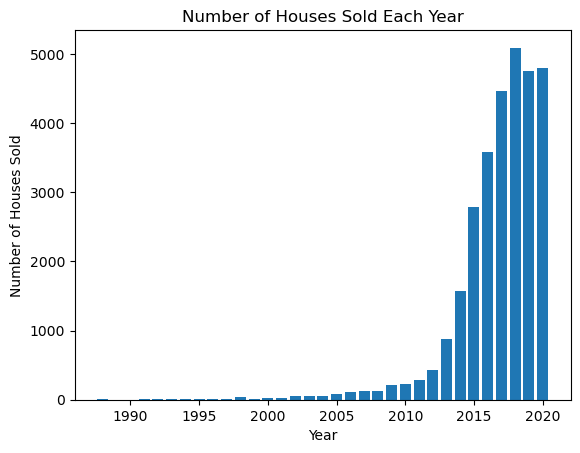

In [178]:
counts = df['SOLD_YEAR'].value_counts()
plt.bar(counts.index, counts.values)
plt.title('Number of Houses Sold Each Year')
plt.xlabel('Year')
plt.ylabel('Number of Houses Sold')
plt.show()

The housing market was booming from 2015-2020 with the majority of houses were sold in this time

How about the price trend, will the housing market get expensive overtime ?

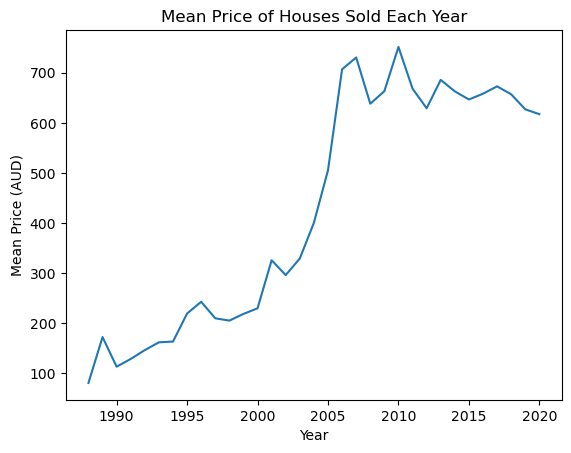

In [179]:
mean_prices = df.groupby('SOLD_YEAR')['PRICE'].mean()

# Create a line plot of the mean price each year
plt.plot(mean_prices.index, mean_prices.values)
plt.title('Mean Price of Houses Sold Each Year')
plt.xlabel('Year')
plt.ylabel('Mean Price (AUD)')
plt.show()

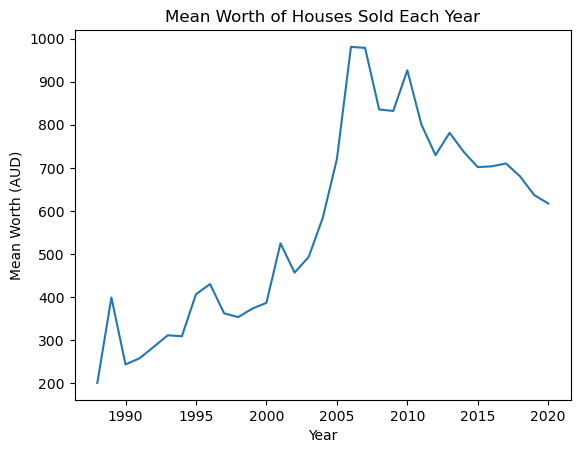

In [180]:
mean_prices = df.groupby('SOLD_YEAR')['WORTH'].mean()

# Create a line plot of the mean price each year
plt.plot(mean_prices.index, mean_prices.values)
plt.title('Mean Worth of Houses Sold Each Year')
plt.xlabel('Year')
plt.ylabel('Mean Worth (AUD)')
plt.show()

As we can see, house's price together with house's worth witnessed a dramatic increase in the period 2000-2005

However it remains balanced for the next 15 years

## 3.2) Boxplot and histogram

Now we gonna have an overview of all other features.

First, let's take a look at the numeric features and its distribution

We define a function to draw boxplot and histogram

In [181]:
# Plot Histogram, Boxplot using Plotly
def px_stats(exclude, ldf, n_cols=4, to_plot='box',height=800,w=None):
    
    numeric_cols = ldf.drop(exclude, axis=1).columns
    n_rows = -(-len(numeric_cols) // n_cols)  # math.ceil in a fast way, without import
    row_pos, col_pos = 1, 0
    fig = make_subplots(rows=n_rows, cols=n_cols,subplot_titles=numeric_cols.to_list())
    
    for col in numeric_cols:
        if(to_plot == 'histogram'):
            trace = go.Histogram(x=ldf[col],showlegend=False,autobinx=True,
                                 marker = dict(color = 'rgb(27, 79, 114)',
                                 line=dict(color='white',width=0)))
        else:
            trace = getattr(px, to_plot)(ldf[col],x=ldf[col])["data"][0]
            
        if col_pos == n_cols: 
            row_pos += 1
        col_pos = col_pos + 1 if (col_pos < n_cols) else 1
        fig.add_trace(trace, row=row_pos, col=col_pos)

    fig.update_traces(marker = dict(color = 'rgb(27, 79, 114)',
                     line=dict(color='white',width=0)))
    fig.update_layout(template='plotly_white');fig.update_layout(margin={"r":0,"t":60,"l":0,"b":0})
    fig.update_layout(height=height,width=w);fig.show()

Draw a boxplot

In [182]:
df.columns

Index(['SUBURB', 'PRICE', 'BEDROOMS', 'BATHROOMS', 'GARAGE', 'LAND_AREA',
       'FLOOR_AREA', 'BUILD_YEAR', 'CBD_DIST', 'NEAREST_STN',
       'NEAREST_STN_DIST', 'POSTCODE', 'LATITUDE', 'LONGITUDE', 'NEAREST_SCH',
       'NEAREST_SCH_DIST', 'SOLD_YEAR', 'AGE', 'Interest', 'PopGrowth',
       'Unemployment', 'Inflation', 'WORTH'],
      dtype='object')

In [184]:
exclude = ["SUBURB","BUILD_YEAR", "SOLD_YEAR", "Interest", "PopGrowth", "Unemployment", "Inflation",'POSTCODE', 'LATITUDE', 'LONGITUDE', 'NEAREST_SCH', 'NEAREST_STN' ]
px_stats(exclude, df)

As we can see our dataset is not stable because it is scrapping from the house-selling website, so many customers can upload anything on it. 

As a result, the dataset contain many outlier, some is consider as false information, such as 99 garages or the land area is 1M m2

Now our job is to remove those outliers so it wont affect the result of our model

Remove anomaly

In [187]:
#remove LAND_AREA larger than 600k 
df = df[df.LAND_AREA <= 100000]
#remove BEDROOMS larger than 7
df = df[df.BATHROOMS <= 7]

Draw a histogram

In [192]:
exclude = ["SUBURB","BUILD_YEAR", "SOLD_YEAR", "Interest", "PopGrowth", "Unemployment", "Inflation",'POSTCODE', 'LATITUDE', 'LONGITUDE', 'NEAREST_SCH', 'NEAREST_STN' ]
px_stats(exclude, df, to_plot='histogram')

Most features are skewed. As I have said above, the customers can upload anything so there is a lot of false information.
 
Also, housing market contains multiple houses with different characteristics and built according to the owner's opinion, we cannot expect the distribution of those would follow a normal distribution.

## 3.3) Choropleth map

Draw a choropleth map too see if location or more specifically, **SUBURB** has any effect on house price

In [194]:
df = df.reset_index(drop = True)

In [195]:
df

,SUBURB,PRICE,BEDROOMS,BATHROOMS,GARAGE,LAND_AREA,FLOOR_AREA,BUILD_YEAR,CBD_DIST,NEAREST_STN,...,LONGITUDE,NEAREST_SCH,NEAREST_SCH_DIST,SOLD_YEAR,AGE,Interest,PopGrowth,Unemployment,Inflation,WORTH
0,South Lake,565.0,4,2,2,600,160,2003.0,18300,Cockburn Central Station,...,115.842450,LAKELAND SENIOR HIGH SCHOOL,0.828339,2018,15,5.260833,1.502993,5.30,1.911401,585.0742
1,Wandi,365.0,3,2,2,351,139,2013.0,26900,Kwinana Station,...,115.859554,ATWELL COLLEGE,5.524324,2019,6,5.101000,1.485208,5.16,1.610768,370.8793
2,Camillo,287.0,3,1,1,719,86,1979.0,22600,Challis Station,...,115.993579,KELMSCOTT SENIOR HIGH SCHOOL,1.649178,2015,36,5.575000,1.439217,6.05,1.508367,311.4860
3,Bellevue,255.0,2,1,2,651,59,1953.0,17900,Midland Station,...,116.038009,SWAN VIEW SENIOR HIGH SCHOOL,1.571401,2018,65,5.260833,1.502993,5.30,1.911401,264.0601
4,Lockridge,325.0,4,1,2,466,131,1998.0,11200,Bassendean Station,...,115.947780,KIARA COLLEGE,1.514922,2016,18,5.420833,1.561940,5.71,1.276991,347.4867
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29810,Aubin Grove,423.0,3,2,2,248,108,2011.0,24900,Cockburn Central Station,...,115.858357,ATWELL COLLEGE,3.607062,2016,5,5.420833,1.561940,5.71,1.276991,452.2672
29811,Middle Swan,467.0,4,2,2,400,132,2014.0,17100,Midland Station,...,116.013543,LA SALLE COLLEGE,1.116806,2015,1,5.575000,1.439217,6.05,1.508367,506.8430
29812,South Fremantle,955.0,3,2,1,200,127,1997.0,16000,Fremantle Station,...,115.756070,FREMANTLE COLLEGE,1.134956,2019,22,5.101000,1.485208,5.16,1.610768,970.3828
29813,South Fremantle,1040.0,4,3,2,292,245,2013.0,16100,Fremantle Station,...,115.751820,CHRISTIAN BROTHERS' COLLEGE,1.430350,2016,3,5.420833,1.561940,5.71,1.276991,1111.9572


In [196]:
df_suburb = df.groupby('SUBURB')['WORTH'].mean().reset_index()

# Rename the column to MEAN_SUBURB_PRICE
df_suburb = df_suburb.rename(columns={'WORTH': 'SUBURB_MEAN_PRICE'})

In [197]:
world_geo = r'https://gist.githubusercontent.com/olgabradford/a0543ac36651eab394fe117580679baa/raw/56144cce6824d76489584988c518d44ecde56c9f/geojson_final_perth_metro.json'
# Change SUBURB name to uppercase for indexing from geojson file
df_suburb_plot = df_suburb.copy()
df_suburb_plot['SUBURB'] = df_suburb_plot['SUBURB'].str.upper()

world_map = folium.Map(location=[-32.0106484086033, 115.86263075450142], zoom_start = 10)
folium.Choropleth(
    geo_data=world_geo,
    data=df_suburb_plot,
    columns=['SUBURB', 'SUBURB_MEAN_PRICE'],
    key_on='feature.properties.wa_local_2',
    fill_color='YlOrRd', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='HOUSE PRICE',
    reset = True
).add_to(world_map)
folium.LayerControl().add_to(world_map)
# display map
world_map

According to the map, the area near water (ocean, lake) does has a higher house price than other area. 

## 3.4) Heatmap

We plot the heatmap to see the correlation between price and other house's features

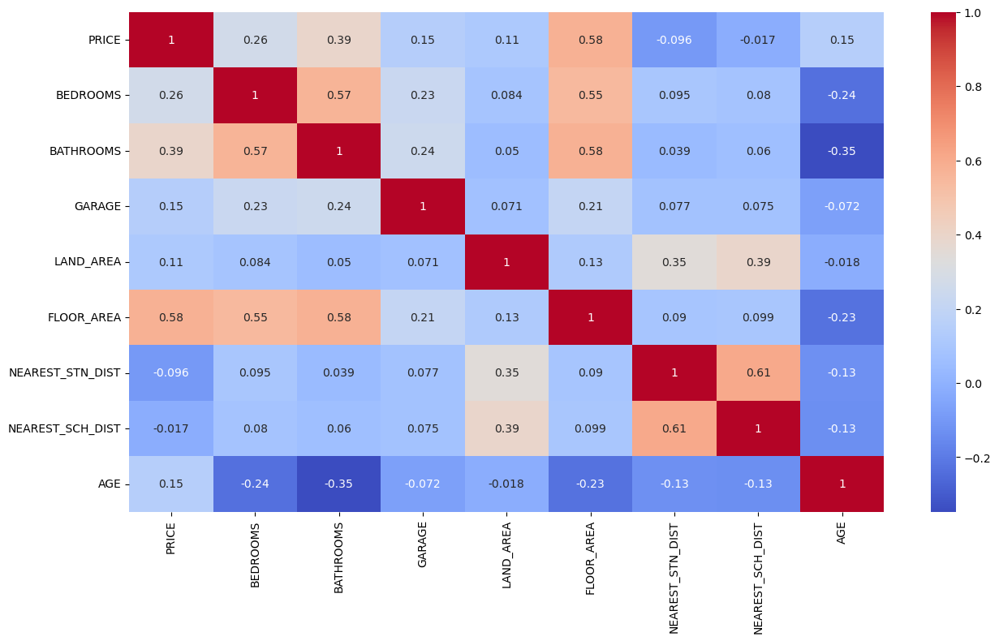

In [200]:

corr_matrix = df[['PRICE', 'BEDROOMS', 'BATHROOMS', 'GARAGE',
                  'LAND_AREA','FLOOR_AREA', 'NEAREST_STN_DIST',
                  'NEAREST_SCH_DIST', 'AGE']].corr()
plt.figure(figsize=(15,8))
sns.heatmap(corr_matrix, cmap="coolwarm", annot = True)
plt.show()


From the heatmap, ```BEDROOMS```, ```BATHROOMS```, ```FLOOR_AREA``` seems to have the most significant impact on the house price

# 4) Prediction model

For the prediction model, we will use all the numeric data together with the ```SUBURB``` because we can see it also affect the house price. 

To use it, we perform One Hot Encoding on the ```SUBURB``` column

In [201]:
#perform One Hot Encoding for SUBURB column
from sklearn.preprocessing import OneHotEncoder

encoder = OneHotEncoder(handle_unknown='ignore')

encoder_df = pd.DataFrame(encoder.fit_transform(df[['SUBURB']]).toarray())

feature_names = encoder.get_feature_names_out (['SUBURB'])

encoder_df.columns = feature_names

encoded_df = df.join(encoder_df)

encoded_df

,SUBURB,PRICE,BEDROOMS,BATHROOMS,GARAGE,LAND_AREA,FLOOR_AREA,BUILD_YEAR,CBD_DIST,NEAREST_STN,...,SUBURB_Wilson,SUBURB_Winthrop,SUBURB_Woodbridge,SUBURB_Woodlands,SUBURB_Woodvale,SUBURB_Wooroloo,SUBURB_Wungong,SUBURB_Yanchep,SUBURB_Yangebup,SUBURB_Yokine
0,South Lake,565.0,4,2,2,600,160,2003.0,18300,Cockburn Central Station,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,Wandi,365.0,3,2,2,351,139,2013.0,26900,Kwinana Station,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,Camillo,287.0,3,1,1,719,86,1979.0,22600,Challis Station,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,Bellevue,255.0,2,1,2,651,59,1953.0,17900,Midland Station,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,Lockridge,325.0,4,1,2,466,131,1998.0,11200,Bassendean Station,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29810,Aubin Grove,423.0,3,2,2,248,108,2011.0,24900,Cockburn Central Station,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
29811,Middle Swan,467.0,4,2,2,400,132,2014.0,17100,Midland Station,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
29812,South Fremantle,955.0,3,2,1,200,127,1997.0,16000,Fremantle Station,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
29813,South Fremantle,1040.0,4,3,2,292,245,2013.0,16100,Fremantle Station,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


## 4.1) Split train test

In [234]:
#without economic index
x = encoded_df.drop(columns = ['WORTH','SOLD_YEAR', 'BUILD_YEAR', 'SUBURB', 'Inflation', 'Interest', 'PopGrowth', 'Unemployment', 'NEAREST_STN', 'POSTCODE', 'LATITUDE', 'LONGITUDE', 'NEAREST_SCH', 'PRICE'])

# #with economic index
# x = encoded_df.drop(columns = ['WORTH','SOLD_YEAR', 'BUILD_YEAR', 'SUBURB', 'Inflation', 'NEAREST_STN', 'POSTCODE', 'LATITUDE', 'LONGITUDE', 'NEAREST_SCH', 'PRICE'])
y = encoded_df[['WORTH']]
x_train, x_test, y_train, y_test = train_test_split(x ,y ,test_size = 0.2, random_state = 1)

## 4.2) Normalization

In [235]:
scaler = StandardScaler()
x_train_norm = scaler.fit_transform(x_train)
x_test_norm = scaler.transform(x_test)

## 4.3) Build model

For this part, I decide to use different models and evaluate their performance

### 4.3.1) Neural Networks

Epoch 1/20
597/597 [==============================] - 1s 849us/step - loss: 6602.7451 - val_loss: 6180.4897
Epoch 2/20
597/597 [==============================] - 0s 721us/step - loss: 5519.3867 - val_loss: 4618.0098
Epoch 3/20
597/597 [==============================] - 0s 727us/step - loss: 3940.4531 - val_loss: 3252.2151
Epoch 4/20
597/597 [==============================] - 0s 743us/step - loss: 2887.9031 - val_loss: 2431.9497
Epoch 5/20
597/597 [==============================] - 0s 742us/step - loss: 2165.5552 - val_loss: 1869.7109
Epoch 6/20
597/597 [==============================] - 0s 737us/step - loss: 1724.4039 - val_loss: 1583.5596
Epoch 7/20
597/597 [==============================] - 0s 730us/step - loss: 1498.4277 - val_loss: 1425.2411
Epoch 8/20
597/597 [==============================] - 0s 732us/step - loss: 1362.8611 - val_loss: 1316.5189
Epoch 9/20
597/597 [==============================] - 0s 747us/step - loss: 1270.4576 - val_loss: 1241.9390
Epoch 10/20
597/597 [=======

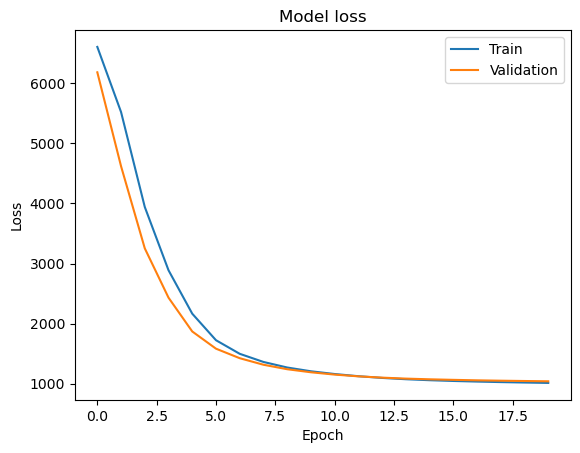

In [236]:
tf.random.set_seed(30)  # applied to achieve consistent results
nn_model = Sequential(
        [
            Dense(16, activation = 'relu'),
            Dense(1, activation = 'relu')
        ]
    )
nn_model.compile(
    loss=tf.keras.losses.Huber(delta=10.0),
    optimizer='adam',
    )
history = nn_model.fit(
            x_train_norm, y_train,
            epochs=20,
            validation_split=0.2
        )

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper right')
plt.show()


### 4.3.2) XGBoost

In [237]:
import xgboost as xgb

xgb_model = xgb.XGBRegressor(objective="reg:squarederror", random_state=42, max_depth= 4, n_estimators = 1000, early_stopping_rounds=10, eval_metric='rmse')
xgb_model.fit(x_train_norm, y_train, verbose=True, eval_set = [(x_test_norm, y_test)])

[0]	validation_0-rmse:578.13411
[1]	validation_0-rmse:441.32951
[2]	validation_0-rmse:355.18978
[3]	validation_0-rmse:302.28306
[4]	validation_0-rmse:271.02942
[5]	validation_0-rmse:253.68013
[6]	validation_0-rmse:244.04382
[7]	validation_0-rmse:236.38814
[8]	validation_0-rmse:230.95006
[9]	validation_0-rmse:227.09418
[10]	validation_0-rmse:223.32429
[11]	validation_0-rmse:221.19779
[12]	validation_0-rmse:219.31725
[13]	validation_0-rmse:216.81762
[14]	validation_0-rmse:215.13847
[15]	validation_0-rmse:213.37520
[16]	validation_0-rmse:211.78964
[17]	validation_0-rmse:209.96614
[18]	validation_0-rmse:209.00814
[19]	validation_0-rmse:208.26853
[20]	validation_0-rmse:207.36932
[21]	validation_0-rmse:206.04676
[22]	validation_0-rmse:205.18296
[23]	validation_0-rmse:204.17899
[24]	validation_0-rmse:203.14267
[25]	validation_0-rmse:201.88906
[26]	validation_0-rmse:201.45091
[27]	validation_0-rmse:200.77226
[28]	validation_0-rmse:200.02636
[29]	validation_0-rmse:199.58034
[30]	validation_0-rm

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=10,
             enable_categorical=False, eval_metric='rmse', feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=4, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=1000, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=42, ...)

In [ ]:
from sklearn.model_selection import GridSearchCV

#dont run it, take too long to run (10 mins) but if you want to try, go ahead :D

# param_grid = {
#                 'max_depth': [3,4,5],
#                 'learning_rate': [0.1, 0.05, 0.02],
                
# }

# optimal_param = GridSearchCV(
#             estimator = xgb.XGBRegressor(objective="reg:squarederror", random_state=42, n_estimators = 1000, early_stopping_rounds=10, eval_metric='rmse'),
#             param_grid=param_grid,
#             verbose = 2,
#             scoring='neg_mean_squared_error',
# )

# optimal_param.fit(x_train_norm, y_train, verbose=False, eval_set = [(x_test_norm, y_test)])

Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] END .....................learning_rate=0.1, max_depth=3; total time=  11.9s
[CV] END .....................learning_rate=0.1, max_depth=3; total time=  11.9s
[CV] END .....................learning_rate=0.1, max_depth=3; total time=  12.0s
[CV] END .....................learning_rate=0.1, max_depth=3; total time=  12.0s
[CV] END .....................learning_rate=0.1, max_depth=3; total time=  10.7s
[CV] END .....................learning_rate=0.1, max_depth=4; total time=  14.8s
[CV] END .....................learning_rate=0.1, max_depth=4; total time=  14.7s
[CV] END .....................learning_rate=0.1, max_depth=4; total time=  14.9s
[CV] END .....................learning_rate=0.1, max_depth=4; total time=  14.8s
[CV] END .....................learning_rate=0.1, max_depth=4; total time=  13.8s
[CV] END .....................learning_rate=0.1, max_depth=5; total time=  14.2s
[CV] END .....................learning_rate=0.1, 

GridSearchCV(estimator=XGBRegressor(base_score=None, booster=None,
                                    callbacks=None, colsample_bylevel=None,
                                    colsample_bynode=None,
                                    colsample_bytree=None,
                                    early_stopping_rounds=10,
                                    enable_categorical=False,
                                    eval_metric='rmse', feature_types=None,
                                    gamma=None, gpu_id=None, grow_policy=None,
                                    importance_type=None,
                                    interaction_constraints=None,
                                    learning_rate=None, max_bi...
                                    max_cat_threshold=None,
                                    max_cat_to_onehot=None, max_delta_step=None,
                                    max_depth=None, max_leaves=None,
                                    min_child_weight=None, m

In [ ]:
# optimal_param.best_estimator
#result is {'learning_rate': 0.1, 'max_depth': 4}

{'learning_rate': 0.1, 'max_depth': 4}

### 4.3.3) Random Forest

In [238]:
from sklearn.ensemble import RandomForestRegressor

rf_model = RandomForestRegressor()

rf_model.fit(x_train_norm, np.ravel(y_train))


RandomForestRegressor()

### 4.3.4) Gradient Boosting

In [239]:
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import mean_absolute_error
gb_model = GradientBoostingRegressor(
     n_estimators=500, learning_rate=0.1, max_depth=5, random_state=1,
     loss='squared_error'
 )
gb_model.fit(x_train_norm, np.ravel(y_train))

GradientBoostingRegressor(max_depth=5, n_estimators=500, random_state=1)

# 5) Model evaluation

In [240]:
def evaluate_result(model, y_test):
    
    y_predicted = model.predict(x_test_norm)
    print('\t \t Model Report')
    print('MAE: ',mean_absolute_error(y_test,y_predicted))
    print('MSE: ',mean_squared_error(y_test,y_predicted))
    print('RMSE: ',np.sqrt(mean_squared_error(y_test,y_predicted)))
    print('Variance Regression Score: ',explained_variance_score(y_test,y_predicted))

    #plot only
    plt.scatter(y_test, y_predicted)
    plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
    plt.xlabel('Actual')
    plt.ylabel('Predicted')
    plt.show()

    # sns.kdeplot(data=y_merge, palette=['orange', 'blue'], log_scale = False)
    
    y_predicted = pd.DataFrame(y_predicted, columns = ['y_predicted'])
    y_test = y_test.reset_index()
    y_test.drop(['index'],axis=1)

    y_merge = y_predicted
    y_merge['y_real'] = y_test['WORTH']
    sns.kdeplot(data=y_merge, palette=['orange', 'blue']) 

We will test the model with the ```x_test_norm``` dataset

For the evaluation metrics, we will take a look at *MAE, MSE and R2 Score*. For better visualization, we also compare the result with the perfect fit line using scatter plot and its distribution between the prediction and actual value.

## 5.1) Neural Network

187/187 [==============================] - 0s 473us/step
	 	 Model Report
MAE:  110.1982580569487
MSE:  33946.541598246666
RMSE:  184.2458726762873
Variance Regression Score:  0.765405323883213


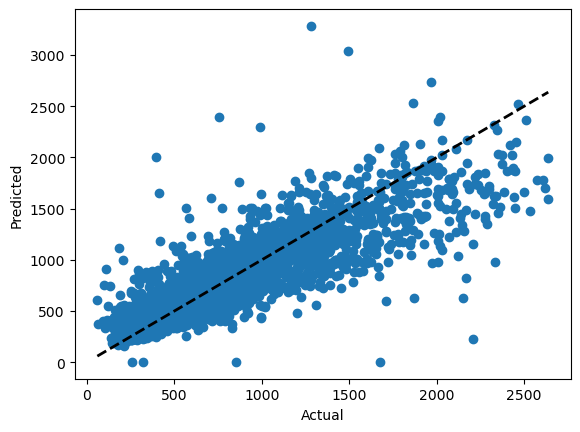

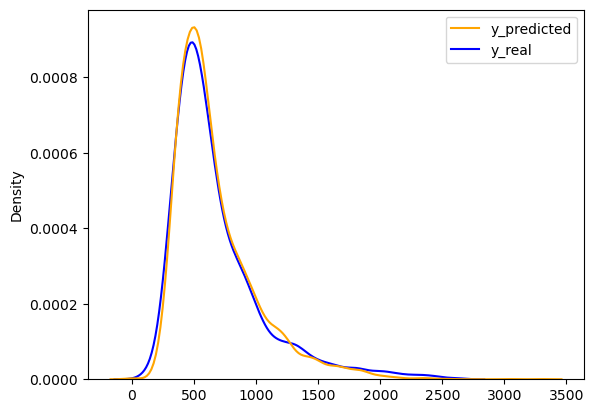

In [241]:
evaluate_result(nn_model, y_test)

As I suspected, with the skewed data like this, building a linear regression model using ANN would return a not-really-good result because it is heavily sensitive to outlier

## 5.2) XGBoost

	 	 Model Report
MAE:  102.554634323875
MSE:  27289.30690922372
RMSE:  165.19475448458925
Variance Regression Score:  0.8109516892855663


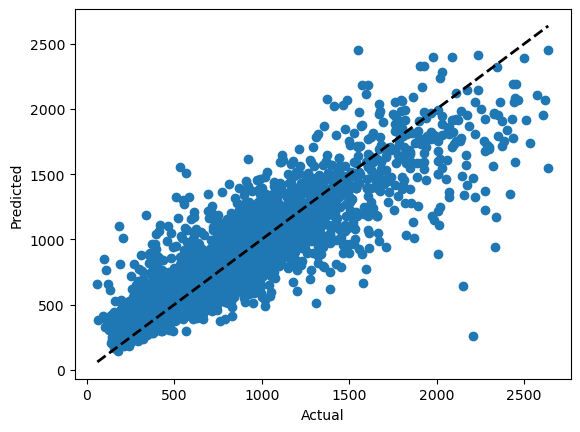

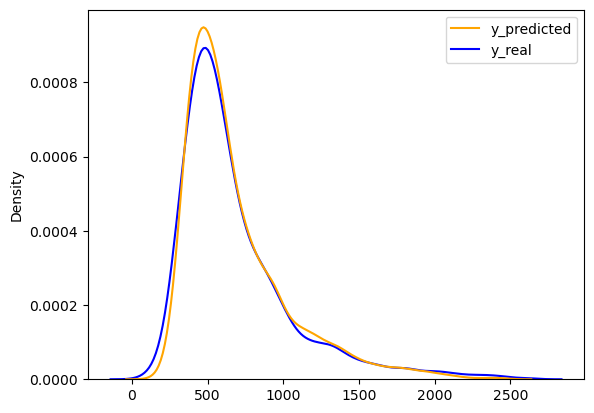

In [242]:
evaluate_result(xgb_model, y_test)

On the other hand, XGBoost perform better because it's more robust to outliers. Although it is still failed to capture the house value above 1.5M AUD

## 5.3) Random Forest

	 	 Model Report
MAE:  110.4010942403712
MSE:  33964.11961534268
RMSE:  184.29356911010942
Variance Regression Score:  0.7647085664957936


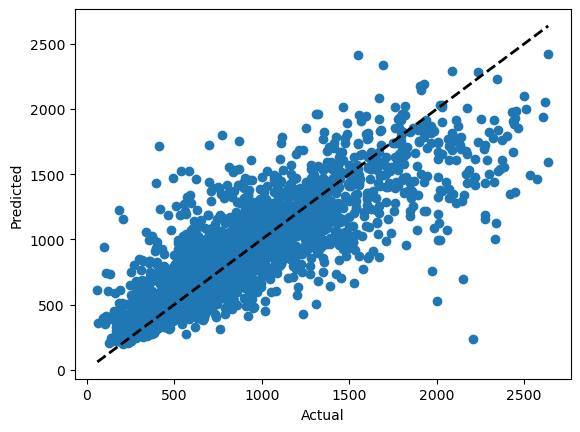

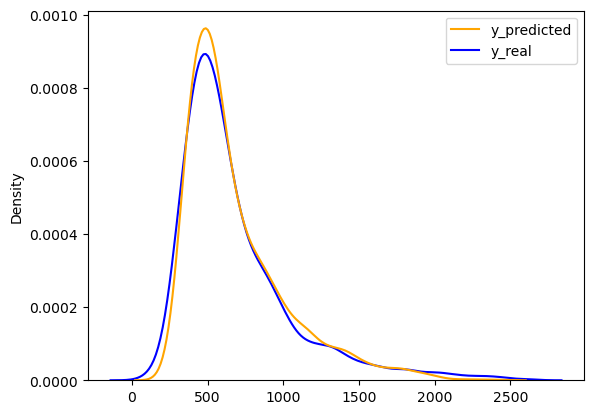

In [243]:
evaluate_result(rf_model, y_test)

## 5.4) Gradient Boosting

	 	 Model Report
MAE:  105.14350784745447
MSE:  28352.32802739582
RMSE:  168.3814955017202
Variance Regression Score:  0.8035990422112028


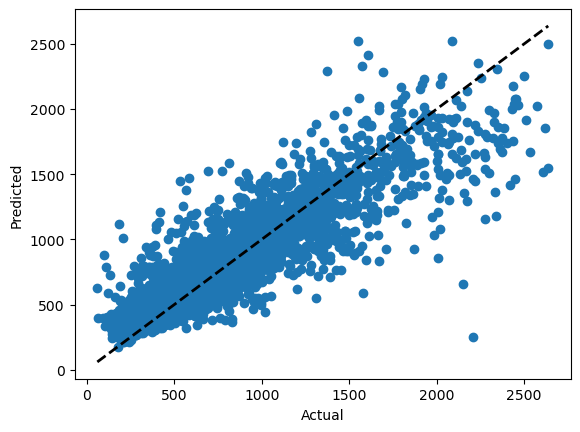

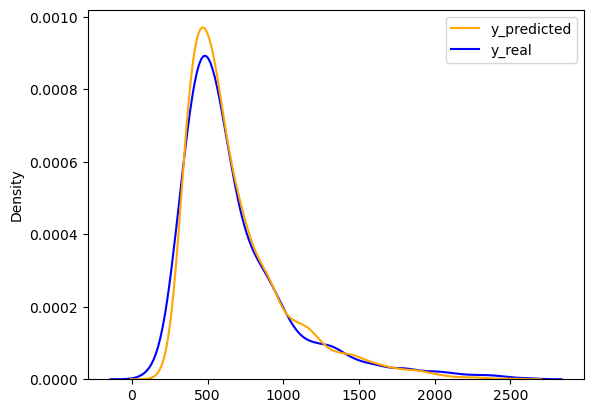

In [244]:
evaluate_result(gb_model, y_test)

Same as XGBoost, it cannot predict well at the price 1.5M AUD and above

# 6) Conclusion

In this notebook, I have investigate the Perth housing data from 1988-2020 and try to predict the house price using some common machine learning model

However, all the model cannot predict well the house price above 1.5M AUD, this is because for a house more than a 1M AUD, the value of that house doesn't reflect only on number of bathrooms, bedrooms, etc. but also on some other aspects like the material, appliances, service and many other thing not include in this dataset, so it is hard to correctly predict those and it also affect the prediction on other houses